<a href="https://colab.research.google.com/github/metsumesquita/master_degree_UPE/blob/main/CI_CONJUNTO_CANCER.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#importaçoes

In [140]:
!pip install kmodes

import kagglehub
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.preprocessing import MinMaxScaler

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")
import pandas as pd
import numpy as np

import requests
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO

from kmodes.kmodes import KModes
from scipy.spatial.distance import cdist
from yellowbrick.cluster import silhouette_visualizer
import math




#conjunto

In [141]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
reihanenamdari_breast_cancer_path = kagglehub.dataset_download('reihanenamdari/breast-cancer')

print('Data source import complete.')


Data source import complete.


In [142]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [143]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

In [144]:
#https://www.kaggle.com/datasets/reihanenamdari/breast-cancer/data
##This dataset was uploaded to U-BRITE for "AI against CANCER DATA SCIENCE HACKATHON"
#https://cancer.ubrite.org/hackathon-2021/
df= pd.read_csv('/content/Breast_Cancer.csv', sep = ',')

In [145]:
df.shape

(4024, 16)

In [146]:
df.head()

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
0,68,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,4,Positive,Positive,24,1,60,Alive
1,50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35,Positive,Positive,14,5,62,Alive
2,58,White,Divorced,T3,N3,IIIC,Moderately differentiated,2,Regional,63,Positive,Positive,14,7,75,Alive
3,58,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,18,Positive,Positive,2,1,84,Alive
4,47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41,Positive,Positive,3,1,50,Alive


In [147]:
df.tail()

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
4019,62,Other,Married,T1,N1,IIA,Moderately differentiated,2,Regional,9,Positive,Positive,1,1,49,Alive
4020,56,White,Divorced,T2,N2,IIIA,Moderately differentiated,2,Regional,46,Positive,Positive,14,8,69,Alive
4021,68,White,Married,T2,N1,IIB,Moderately differentiated,2,Regional,22,Positive,Negative,11,3,69,Alive
4022,58,Black,Divorced,T2,N1,IIB,Moderately differentiated,2,Regional,44,Positive,Positive,11,1,72,Alive
4023,46,White,Married,T2,N1,IIB,Moderately differentiated,2,Regional,30,Positive,Positive,7,2,100,Alive


In [148]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4024 entries, 0 to 4023
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Age                     4024 non-null   int64 
 1   Race                    4024 non-null   object
 2   Marital Status          4024 non-null   object
 3   T Stage                 4024 non-null   object
 4   N Stage                 4024 non-null   object
 5   6th Stage               4024 non-null   object
 6   differentiate           4024 non-null   object
 7   Grade                   4024 non-null   object
 8   A Stage                 4024 non-null   object
 9   Tumor Size              4024 non-null   int64 
 10  Estrogen Status         4024 non-null   object
 11  Progesterone Status     4024 non-null   object
 12  Regional Node Examined  4024 non-null   int64 
 13  Reginol Node Positive   4024 non-null   int64 
 14  Survival Months         4024 non-null   int64 
 15  Stat

In [149]:
df.describe()

,Age,Tumor Size,Regional Node Examined,Reginol Node Positive,Survival Months
count,4024.000000,4024.000000,4024.000000,4024.000000,4024.000000
mean,53.972167,30.473658,14.357107,4.158052,71.297962
std,8.963134,21.119696,8.099675,5.109331,22.921430
min,30.000000,1.000000,1.000000,1.000000,1.000000
25%,47.000000,16.000000,9.000000,1.000000,56.000000
50%,54.000000,25.000000,14.000000,2.000000,73.000000
75%,61.000000,38.000000,19.000000,5.000000,90.000000
max,69.000000,140.000000,61.000000,46.000000,107.000000


In [150]:
#porcentagem por variavel de missing values or NaN in the rows
#df.isnull().sum()/df.shape[0]*100

#sem dados faltantes

In [151]:
df.isna().sum()

,0
Age,0
Race,0
Marital Status,0
T Stage,0
N Stage,0
6th Stage,0
differentiate,0
Grade,0
A Stage,0
Tumor Size,0


In [152]:
#Remover duplicados no DataFrame inteiro
df = df.drop_duplicates()

In [153]:
df[200:250]

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
200,55,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,25,Positive,Positive,14,2,77,Alive
201,60,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,25,Positive,Positive,16,4,63,Alive
202,66,White,Married,T1,N1,IIA,Moderately differentiated,2,Regional,12,Positive,Negative,1,1,45,Dead
203,50,White,Single,T2,N3,IIIC,Poorly differentiated,3,Regional,25,Positive,Positive,17,12,25,Dead
204,64,Other,Widowed,T1,N1,IIA,Well differentiated,1,Regional,17,Positive,Positive,2,1,68,Alive
205,67,White,Widowed,T1,N1,IIA,Moderately differentiated,2,Regional,11,Positive,Positive,6,1,53,Alive
206,56,Other,Single,T2,N1,IIB,Moderately differentiated,2,Regional,32,Positive,Positive,24,1,91,Alive
207,60,Other,Married,T2,N1,IIB,Well differentiated,1,Regional,21,Positive,Positive,18,1,105,Alive
208,56,White,Widowed,T2,N1,IIB,Moderately differentiated,2,Regional,25,Positive,Negative,12,1,76,Alive
209,48,White,Divorced,T4,N1,IIIB,Poorly differentiated,3,Regional,19,Positive,Positive,6,1,94,Alive


In [154]:
# Obtendo os nomes das colunas
df.columns

Index(['Age', 'Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage',
       'differentiate', 'Grade', 'A Stage', 'Tumor Size', 'Estrogen Status',
       'Progesterone Status', 'Regional Node Examined',
       'Reginol Node Positive', 'Survival Months', 'Status'],
      dtype='object')

In [155]:

df.rename(columns={'differentiate':'Differentiate', 'Reginol Node Positive':'Regional Node Positive'}, inplace=True)

<ipython-input-155-59a273c9496b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={'differentiate':'Differentiate', 'Reginol Node Positive':'Regional Node Positive'}, inplace=True)


In [156]:
df.isna().sum()

,0
Age,0
Race,0
Marital Status,0
T Stage,0
N Stage,0
6th Stage,0
Differentiate,0
Grade,0
A Stage,0
Tumor Size,0


In [157]:
df.rename(columns={'T Stage ':'T Stage'},inplace=True)

In [158]:
rows_with_nan = df[df.isna().any(axis=1)]
print(rows_with_nan)

Empty DataFrame
Columns: [Age, Race, Marital Status, T Stage, N Stage, 6th Stage, Differentiate, Grade, A Stage, Tumor Size, Estrogen Status, Progesterone Status, Regional Node Examined, Regional Node Positive, Survival Months, Status]
Index: []


#informações sobre as colunas, com visualização

In [159]:
#https://www.cancerresearchuk.org/about-cancer/breast-cancer/stages-grades/stage-2#:~:text=Stage%202B%20means%20one%20of,cells%20in%20the%20lymph%20nodes
#https://www.nationalbreastcancer.org/breast-cancer-stage-3/
#https://www.cancerresearchuk.org/about-cancer/breast-cancer/stages-grades/stage-3

#https://cancer.ca/en/cancer-information/cancer-types/breast/staging#:~:text=Stage%203A,other%20parts%20of%20the%20body.

In [160]:
#'A Stage'
#Cancer staging is a way to measure the extent of cancer in your body.
#Regional — A neoplasm that has extended,
#Distant — A neoplasm that has spread to parts of the body remote from the origin of the cancer
grouped = df.groupby('A Stage').size()
grouped_sorted = grouped.sort_values(ascending=False)
print(grouped_sorted)

A Stage
Regional    3931
Distant       92
dtype: int64


##'Survival Months'

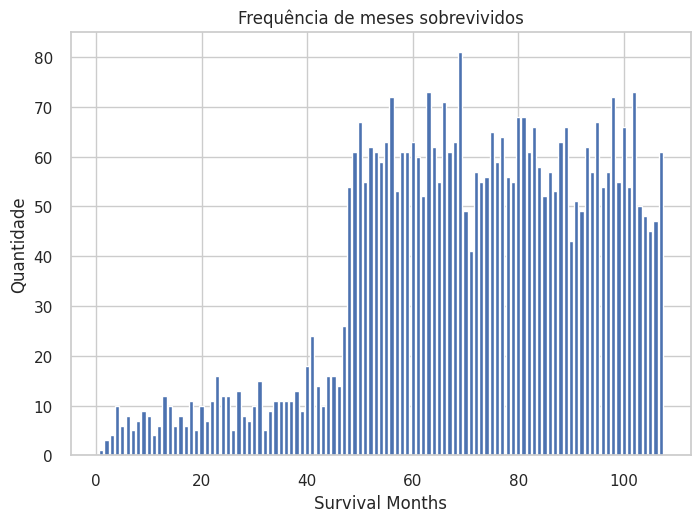

In [161]:
'Survival Months'
plt.bar(df['Survival Months'].value_counts().index, df['Survival Months'].value_counts())
plt.xlabel('Survival Months')
plt.ylabel('Quantidade')
plt.title('Frequência de meses sobrevividos')
plt.show()

##age

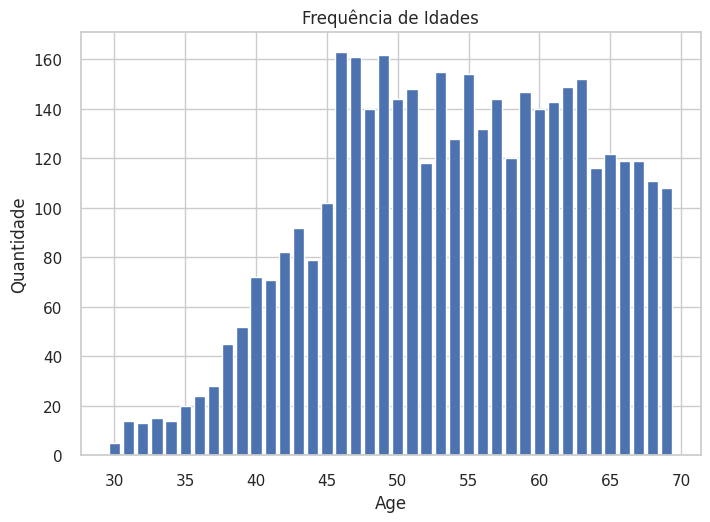

In [162]:
plt.bar(df['Age'].value_counts().index, df['Age'].value_counts())
plt.xlabel('Age')
plt.ylabel('Quantidade')
plt.title('Frequência de Idades')
plt.show()

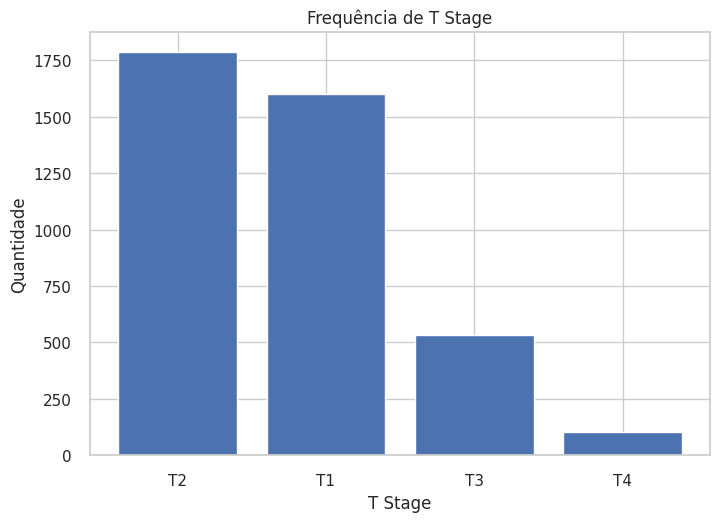

In [163]:


#T Stage

# Gráfico de barras
plt.bar(df['T Stage'].value_counts().index, df['T Stage'].value_counts())
plt.xlabel('T Stage')
plt.ylabel('Quantidade')
plt.title('Frequência de T Stage')
plt.show()

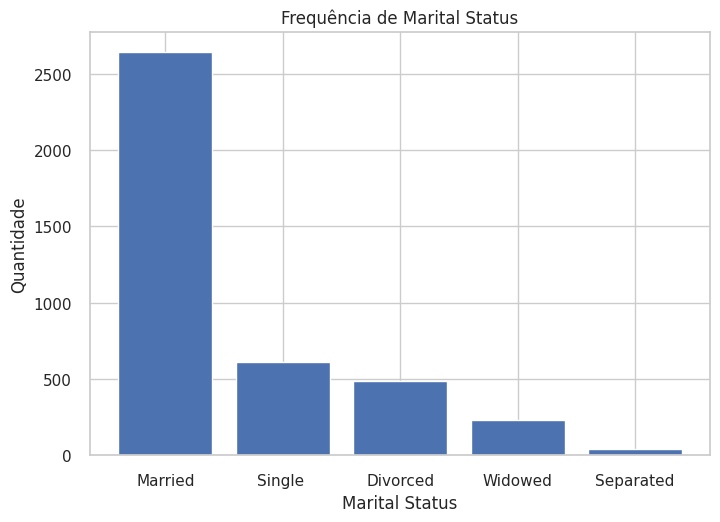

In [164]:
#'Marital Status'

# Gráfico de barras
plt.bar(df['Marital Status'].value_counts().index, df['Marital Status'].value_counts())
plt.xlabel('Marital Status')
plt.ylabel('Quantidade')
plt.title('Frequência de Marital Status')
plt.show()

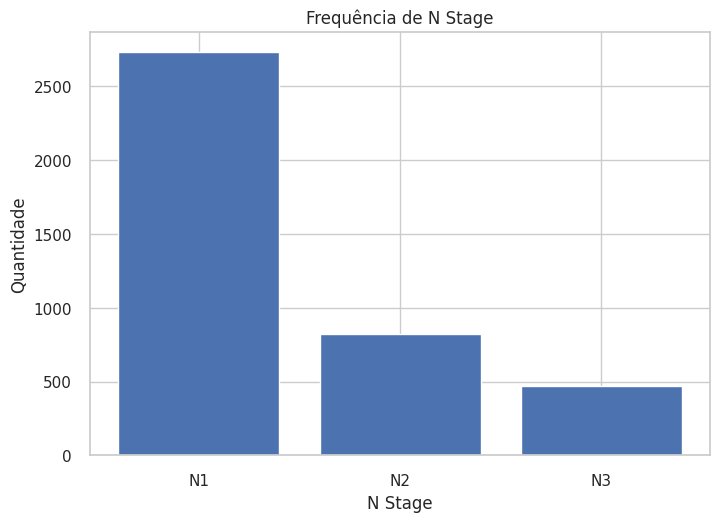

In [165]:
#N Stage
#N describes whether there are any cancer cells in the lymph nodes

plt.bar(df['N Stage'].value_counts().index, df['N Stage'].value_counts())
plt.xlabel('N Stage')
plt.ylabel('Quantidade')
plt.title('Frequência de N Stage')
plt.show()

##Grade

In [166]:
df['Grade'] = df['Grade'].replace(' anaplastic; Grade IV', '4')

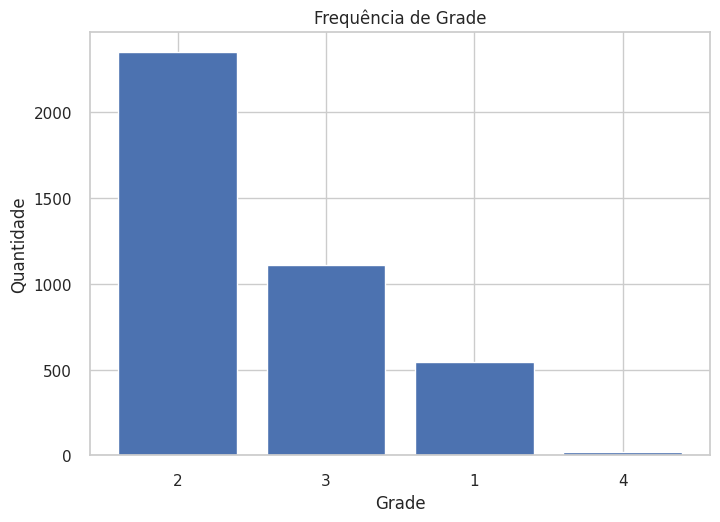

In [167]:
#Cancer grade is based on how the cancer cells look.
#Knowing the cancer grade helps your doctors predict how fast the cancer will grow and how likely it is to spread.
#Grade is usually described using a number from 1 to 3 or 4

#in this dataset,grade is described as 1 to 3

plt.bar(df['Grade'].value_counts().index, df['Grade'].value_counts())
plt.xlabel('Grade')
plt.ylabel('Quantidade')
plt.title('Frequência de Grade')
plt.show()

##6th Stage

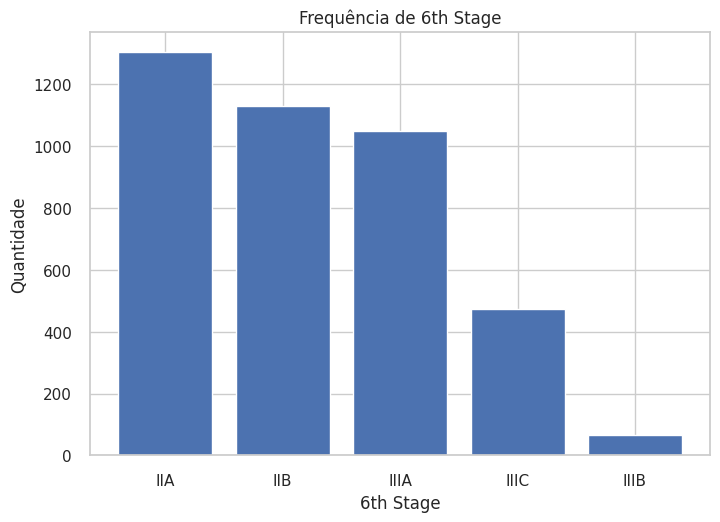

In [168]:
#6th Stage
#meio que é o nivel , junta informação do tamanho + ate onde ja se espalhou e a forma de


plt.bar(df['6th Stage'].value_counts().index, df['6th Stage'].value_counts())
plt.xlabel('6th Stage')
plt.ylabel('Quantidade')
plt.title('Frequência de 6th Stage')
plt.show()

##'Regional Node Examined'

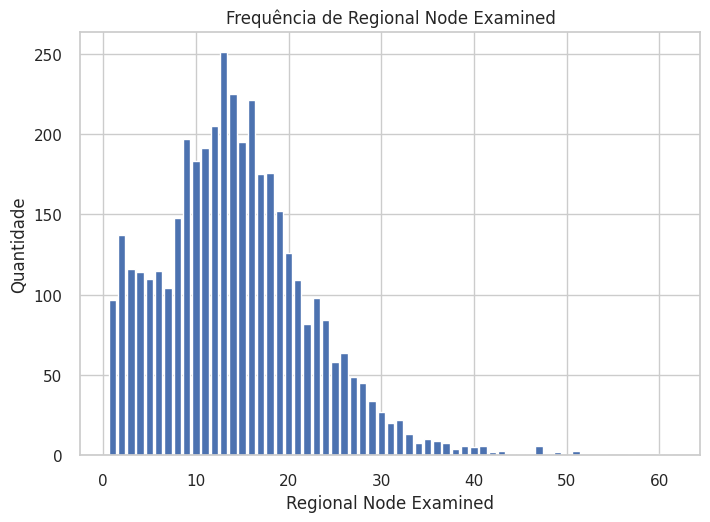

In [169]:
# Gráfico de barras
plt.bar(df['Regional Node Examined'].value_counts().index, df['Regional Node Examined'].value_counts())
plt.xlabel('Regional Node Examined')
plt.ylabel('Quantidade')
plt.title('Frequência de Regional Node Examined')
plt.show()

##'Regional Node Positive'

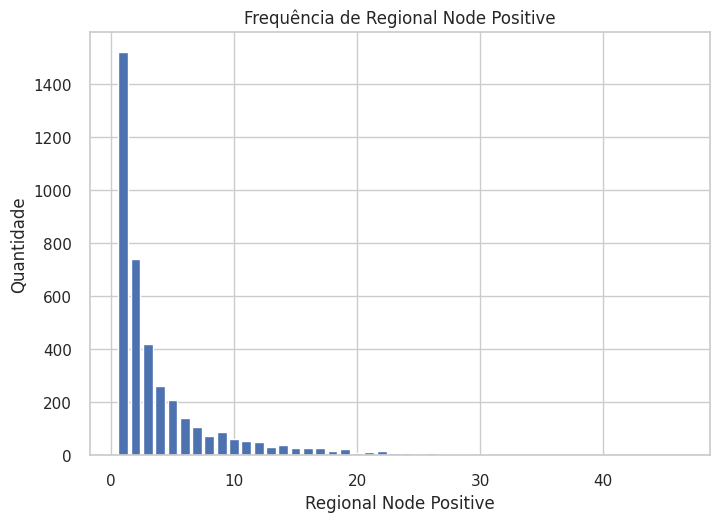

In [170]:
#'Regional Node Positive'

# Gráfico de barras
plt.bar(df['Regional Node Positive'].value_counts().index, df['Regional Node Positive'].value_counts())
plt.xlabel('Regional Node Positive')
plt.ylabel('Quantidade')
plt.title('Frequência de Regional Node Positive')
plt.show()



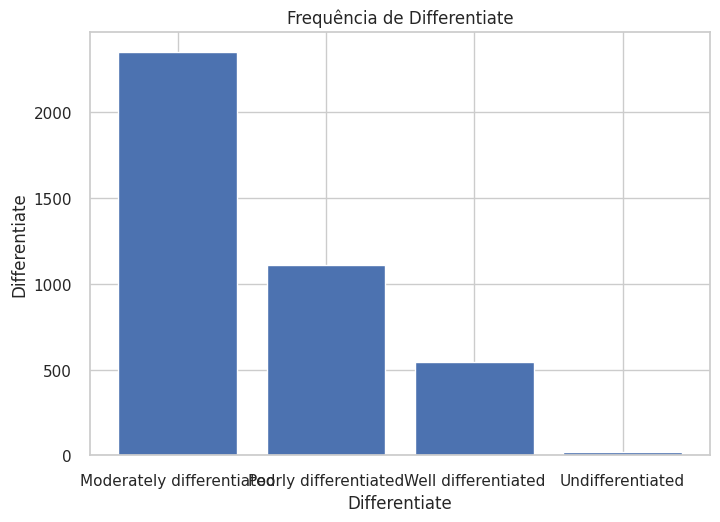

In [171]:


#'Differentiate'
# Gráfico de barras
plt.bar(df['Differentiate'].value_counts().index, df['Differentiate'].value_counts())
plt.xlabel('Differentiate')
plt.ylabel('Differentiate')
plt.title('Frequência de Differentiate')
plt.show()


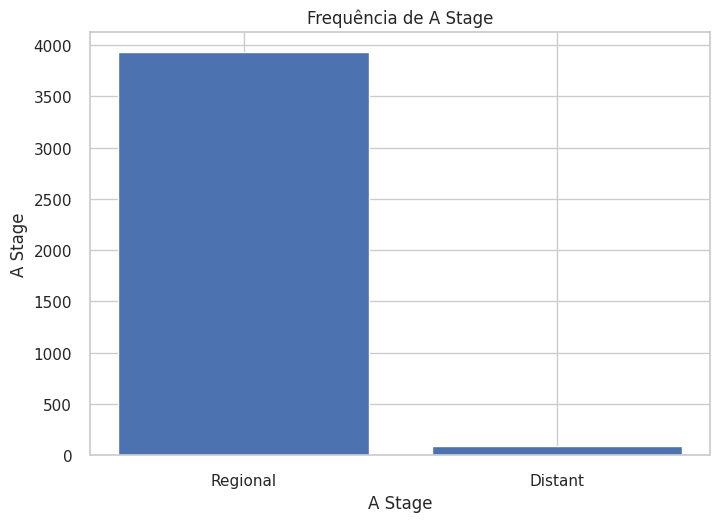

In [172]:
#'A Stage'

# Gráfico de barras
plt.bar(df['A Stage'].value_counts().index, df['A Stage'].value_counts())
plt.xlabel('A Stage')
plt.ylabel('A Stage')
plt.title('Frequência de A Stage')
plt.show()

##tumor size

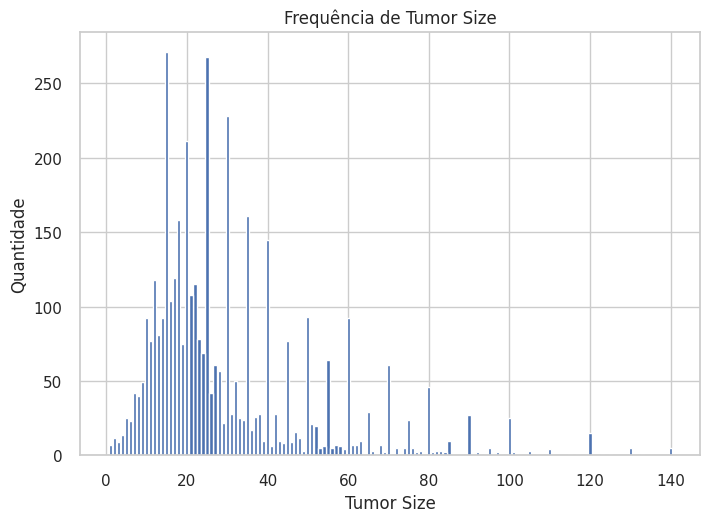

In [173]:

#''Tumor Size''

# Gráfico de barras
plt.bar(df['Tumor Size'].value_counts().index, df['Tumor Size'].value_counts())
plt.xlabel('Tumor Size')
plt.ylabel('Quantidade')
plt.title('Frequência de Tumor Size')
plt.show()


#Grade turmor diferenciação - imagem

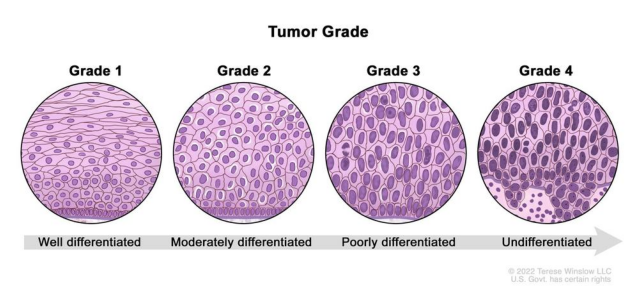

In [174]:


# URL of the image
url = "https://www.cancer.gov/sites/g/files/xnrzdm211/files/styles/cgov_article/public/cgov_contextual_image/2022-12/tumor%20grade.jpg?itok=UMBhYthV"

# Send GET request to fetch the image
response = requests.get(url)

# Check if the request was successful
if response.status_code == 200:
    # Open the image using PIL (Pillow)
    img = Image.open(BytesIO(response.content))

    # Display the image inline with matplotlib
    plt.imshow(img)
    plt.axis('off')  # Hide axes for cleaner display
    plt.show()
else:
    print("Failed to retrieve the image.")


#visualizações iniciais

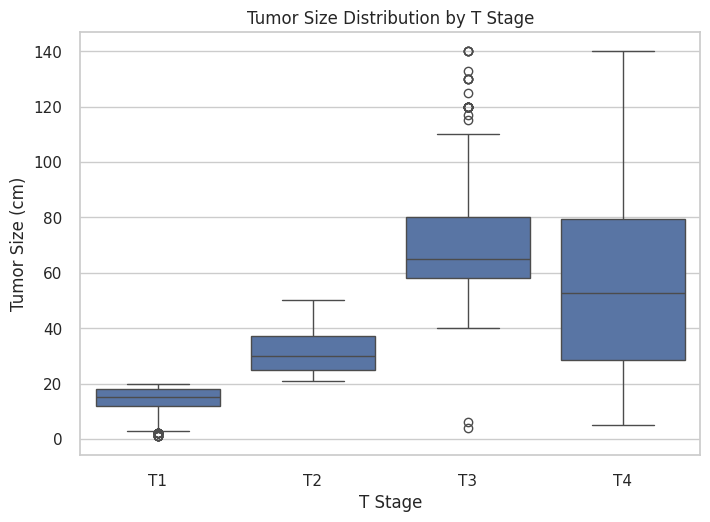

In [175]:
sns.boxplot(x='T Stage', y='Tumor Size', data=df)
plt.title('Tumor Size Distribution by T Stage')
plt.xlabel('T Stage')
plt.ylabel('Tumor Size (cm)')
plt.show()
#There are outliers present in all T stages, especially in T3 and T4,
#indicating that there are some tumors significantly larger than the majority.

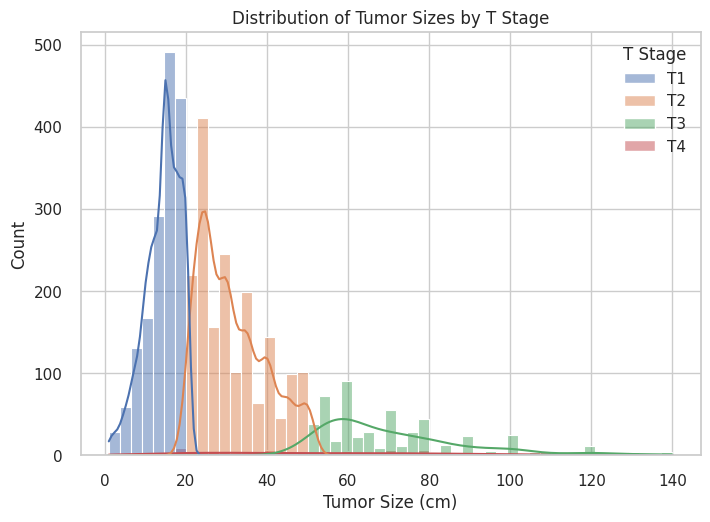

In [176]:
sns.histplot(data=df, x='Tumor Size', hue='T Stage', kde=True)
plt.title('Distribution of Tumor Sizes by T Stage')
plt.xlabel('Tumor Size (cm)')
plt.ylabel('Count')
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:718: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


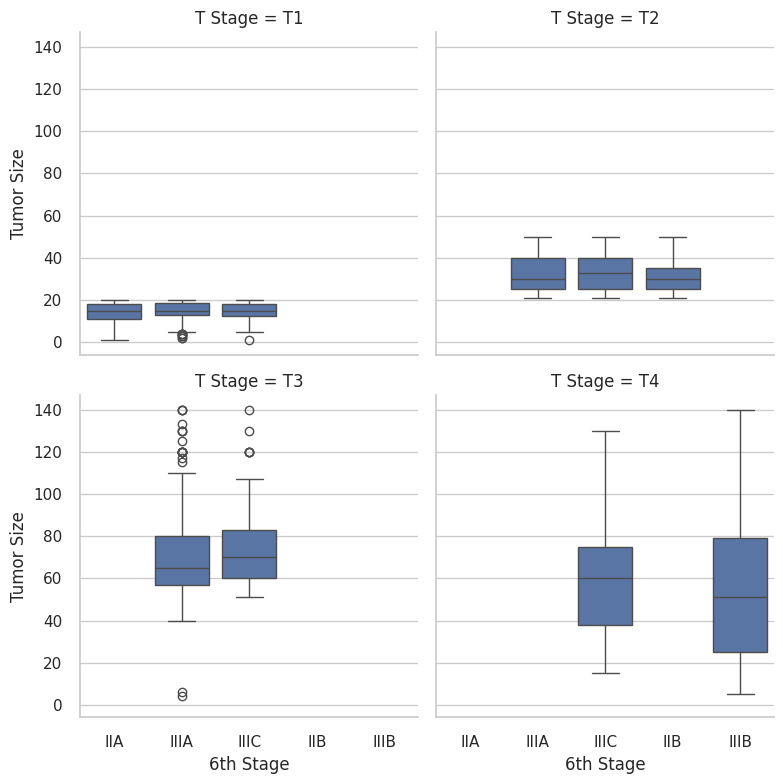

In [177]:
#https://www.cancerresearchuk.org/about-cancer/breast-cancer/stages-grades/stage-3
#a variavel 6th stage é igual basicamente a essa separação que é vista nas imagens
g = sns.FacetGrid(df, col="T Stage", col_wrap=2, height=4)
g.map(sns.boxplot,"6th Stage", "Tumor Size")
plt.show()

#pairplot

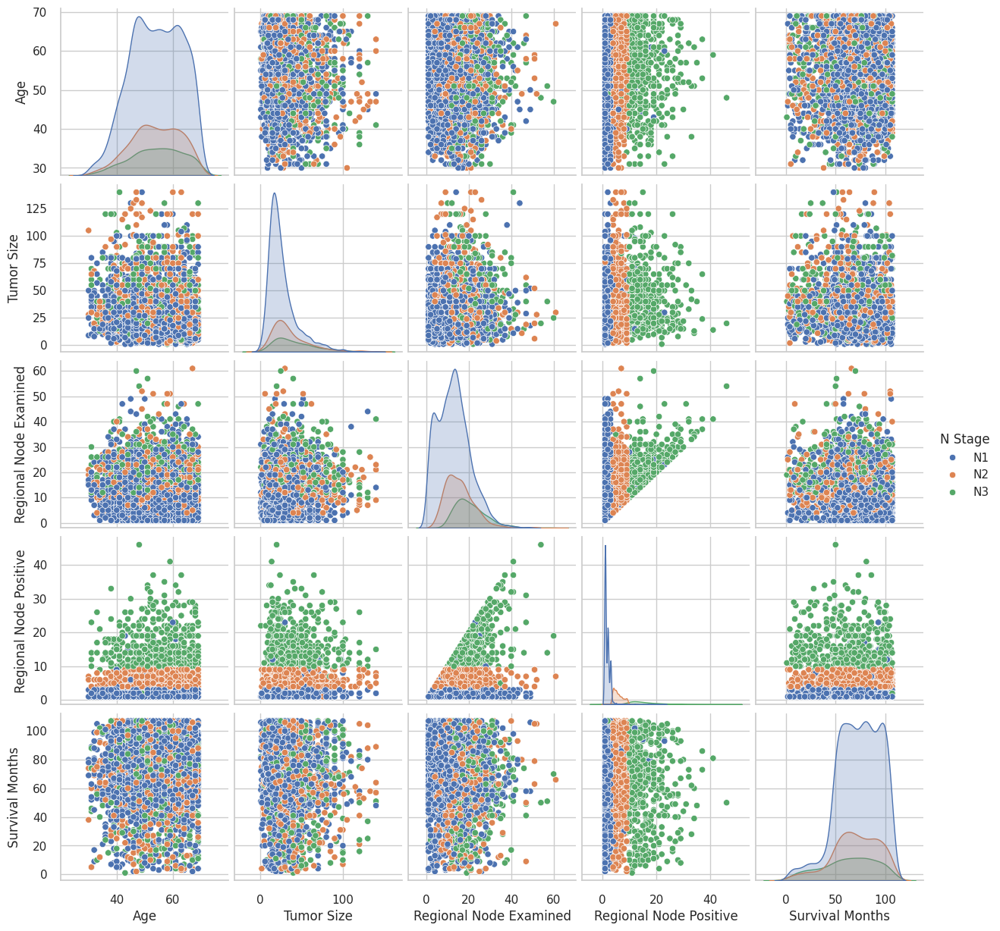

In [178]:
sns.pairplot(df, hue ='N Stage')

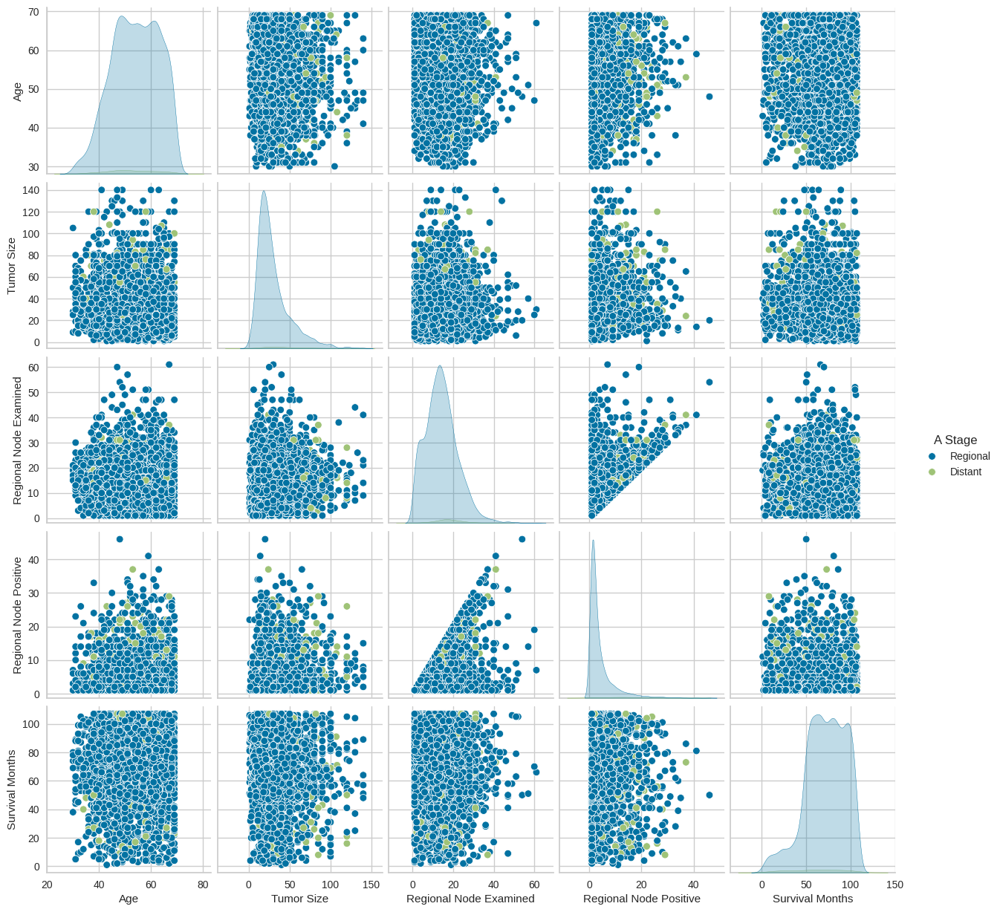

In [69]:
sns.pairplot(df, hue ='A Stage')

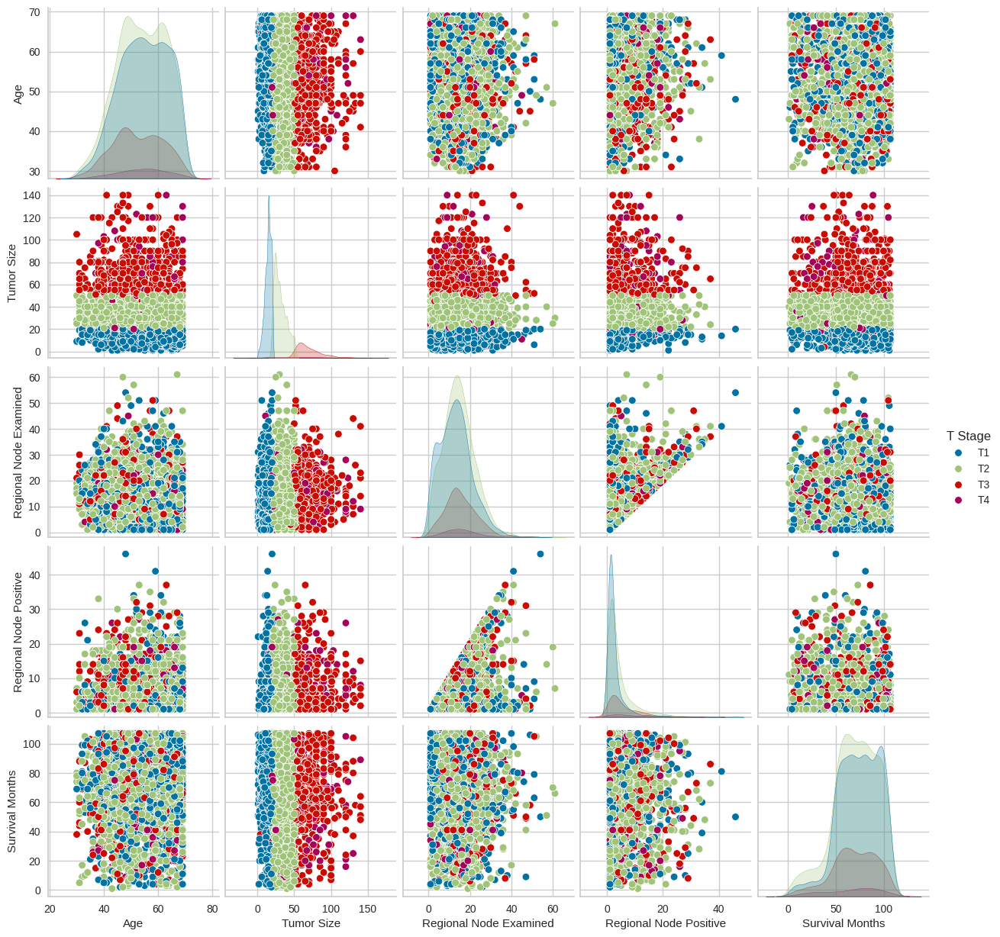

In [70]:
sns.pairplot(df, hue ='T Stage')

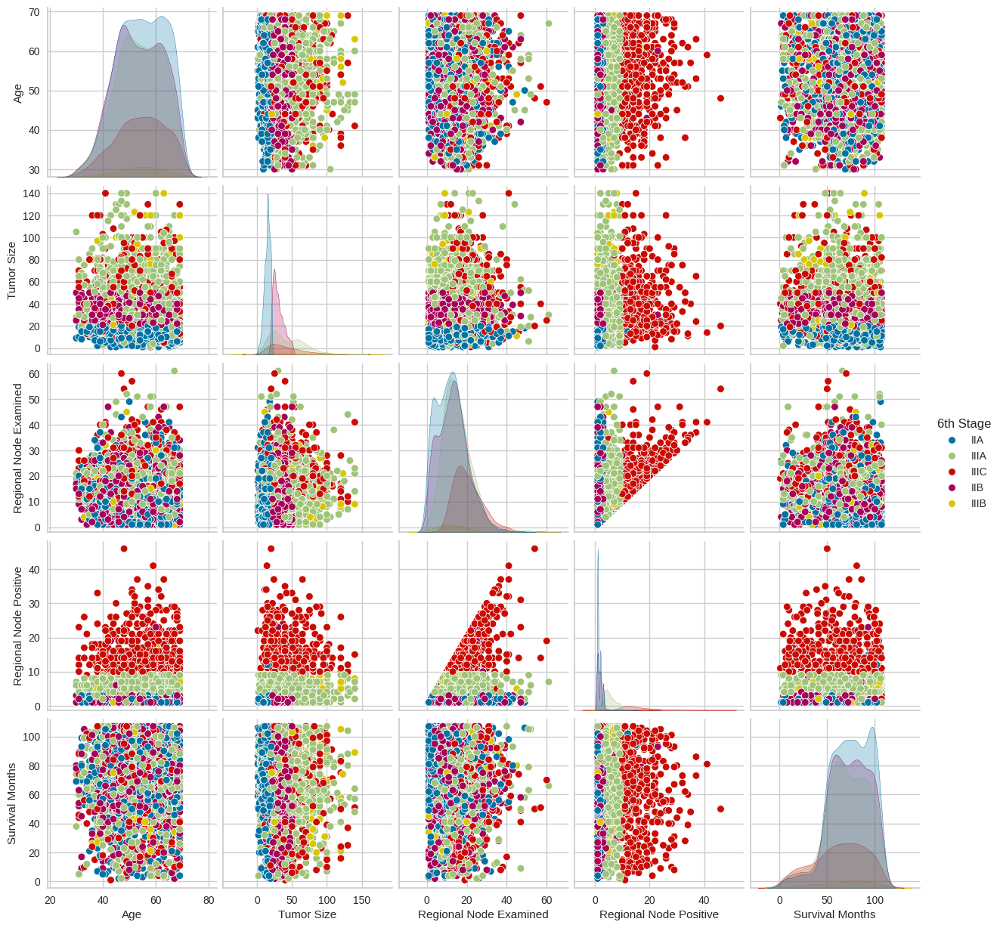

In [71]:
sns.pairplot(df, hue ='6th Stage')

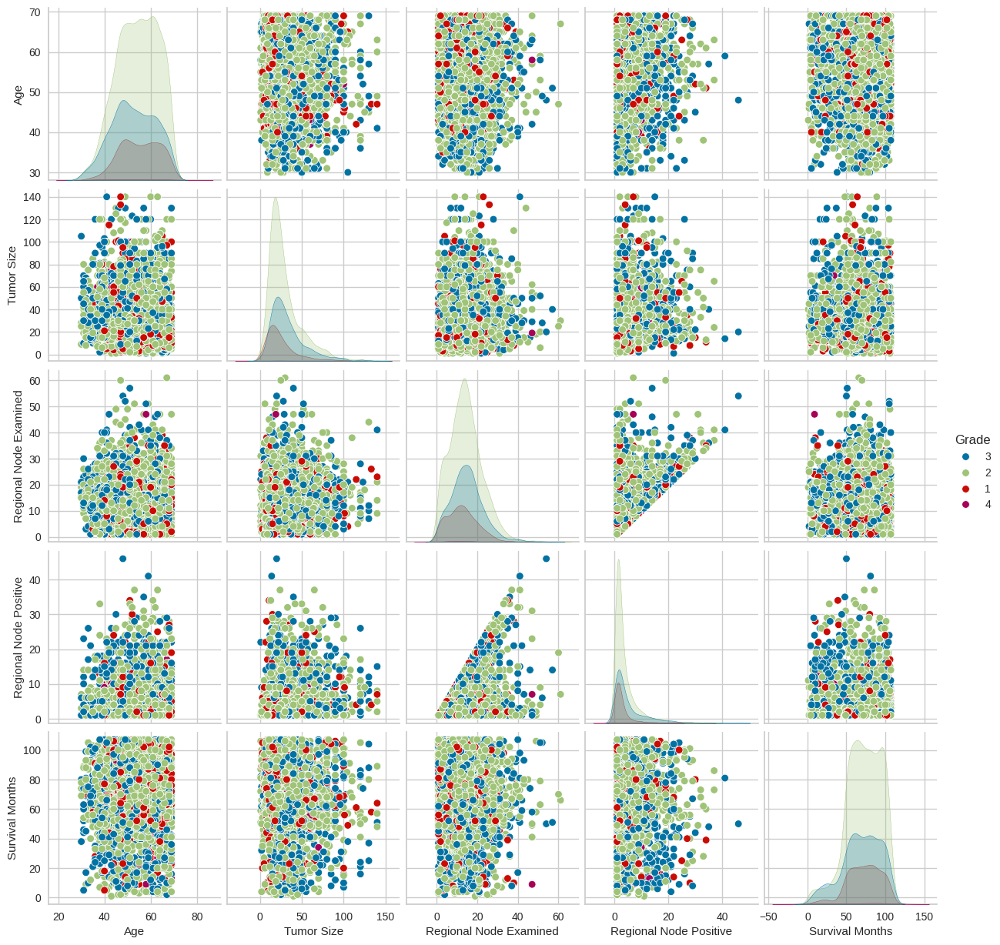

In [72]:
sns.pairplot(df, hue = 'Grade')

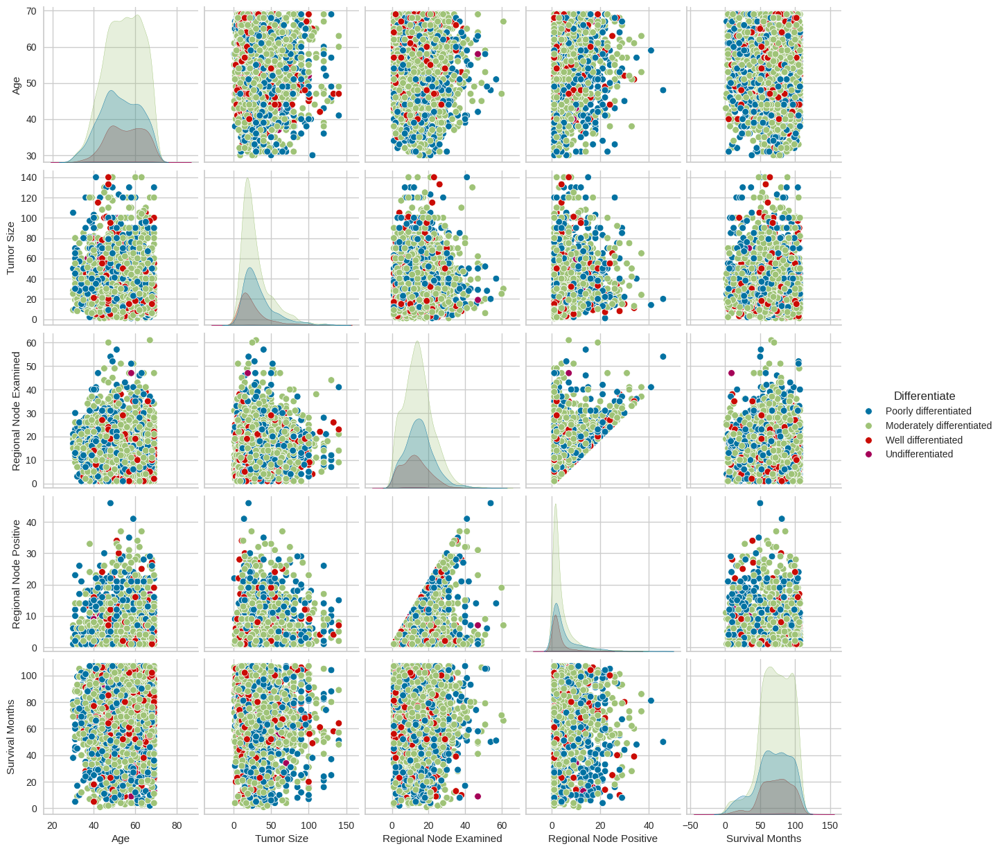

In [74]:
sns.pairplot(df, hue = 'Differentiate')

#mapa de calor apenas com numerico

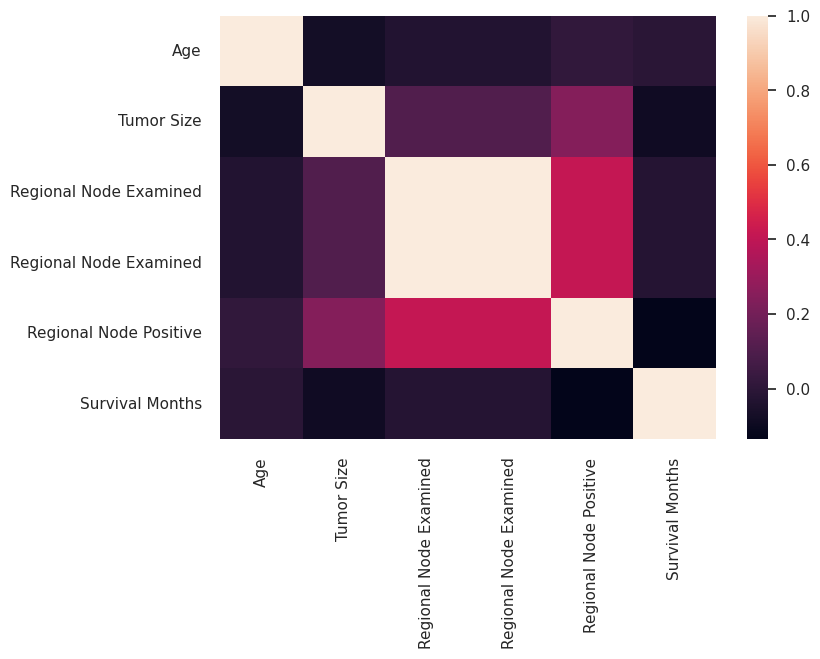

In [179]:

tabela= df.loc[:,['Age','Tumor Size','Regional Node Examined','Regional Node Examined','Regional Node Positive','Survival Months']]
sns.heatmap(tabela.corr());

#grafico de silhouette

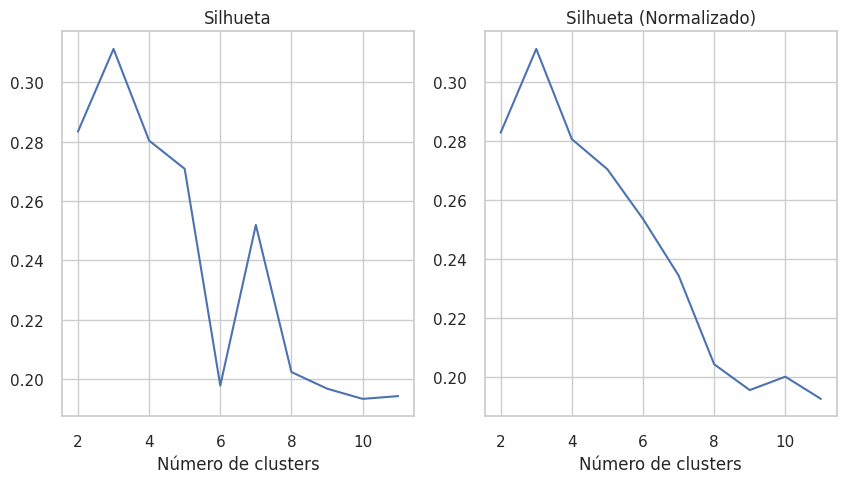

In [180]:
#A pontuação é máxima com 3 clusters, sugerindo que este é o número mais apropriado para segmentar os dados sem normalização.
#A pontuação diminui drasticamente a partir de 4 clusters e permanece relativamente baixa para valores maiores. Isso indica que, ao aumentar o número de clusters, a qualidade do agrupamento cai, possivelmente devido à criação de clusters artificiais.
from sklearn.metrics import silhouette_score, silhouette_samples

#https://scikit-learn.org/1.5/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
#https://varshasaini.in/glossary/silhouette-analysis/
#https://medium.com/@favourphilic/how-to-interpret-silhouette-plot-for-k-means-clustering-414e144a17fe
tabela= df.loc[:,['Age','Tumor Size','Regional Node Examined','Regional Node Examined','Regional Node Positive','Survival Months']]
sil = []
for i in range(2, 12):
    km = KMeans(n_clusters=i)
    km = km.fit(tabela)
    sil.append(silhouette_score(tabela, km.labels_))

silNorm = []
for i in range(2, 12):
    km = KMeans(n_clusters=i)
    km = km.fit(tabela)
    silNorm.append(silhouette_score(tabela, km.labels_))

fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(range(2, 12), sil)
ax1.set_title("Silhueta")
ax1.set_xlabel("Número de clusters")
ax2.plot(range(2, 12), silNorm)
ax2.set_title("Silhueta (Normalizado)")
ax2.set_xlabel("Número de clusters")
plt.show()

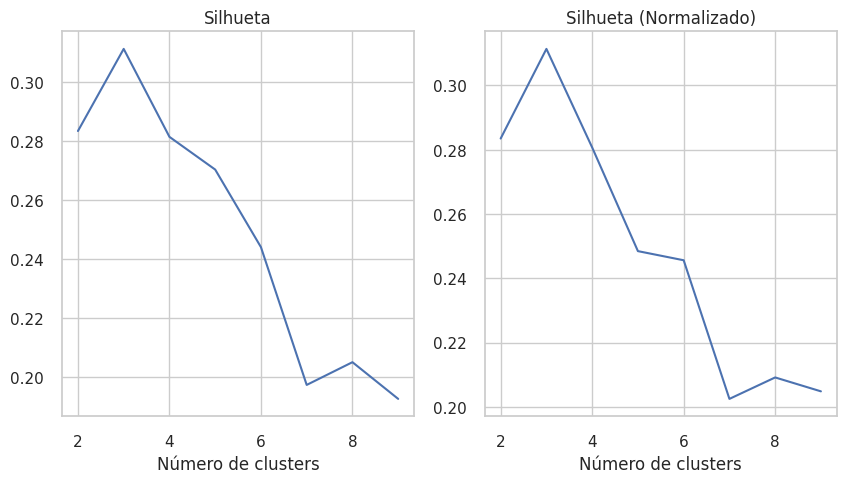

In [181]:
from sklearn.metrics import silhouette_score, silhouette_samples

#https://scikit-learn.org/1.5/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
#https://varshasaini.in/glossary/silhouette-analysis/
#https://medium.com/@favourphilic/how-to-interpret-silhouette-plot-for-k-means-clustering-414e144a17fe

#https://scikit-learn.org/1.5/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

tabela= df.loc[:,['Age','Tumor Size','Regional Node Examined','Regional Node Examined','Regional Node Positive','Survival Months']]
sil = []
for i in range(2, 10):
    km = KMeans(n_clusters=i)
    km = km.fit(tabela)
    sil.append(silhouette_score(tabela, km.labels_))

silNorm = []
for i in range(2, 10):
    km = KMeans(n_clusters=i)
    km = km.fit(tabela)
    silNorm.append(silhouette_score(tabela, km.labels_))

fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(range(2, 10), sil)
ax1.set_title("Silhueta")
ax1.set_xlabel("Número de clusters")
ax2.plot(range(2, 10), silNorm)
ax2.set_title("Silhueta (Normalizado)")
ax2.set_xlabel("Número de clusters")
plt.show()

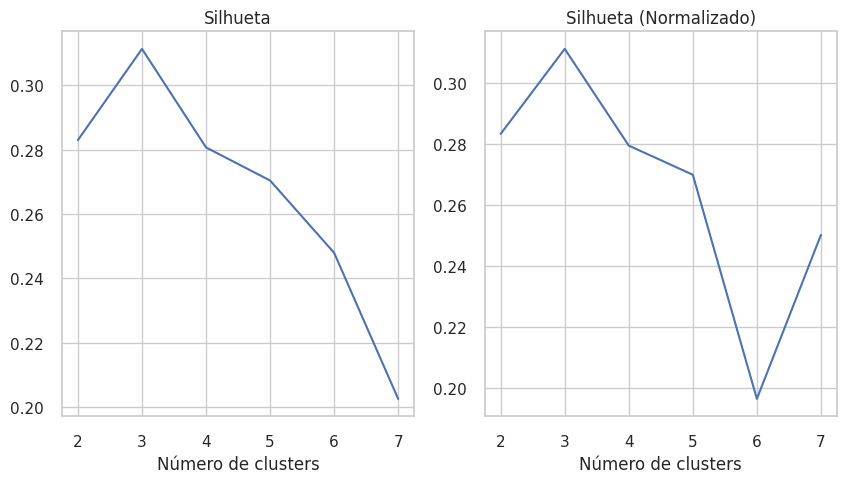

In [182]:
tabela= df.loc[:,['Age','Tumor Size','Regional Node Examined','Regional Node Examined','Regional Node Positive','Survival Months']]
sil = []
for i in range(2, 8):
    km = KMeans(n_clusters=i)
    km = km.fit(tabela)
    sil.append(silhouette_score(tabela, km.labels_))

silNorm = []
for i in range(2, 8):
    km = KMeans(n_clusters=i)
    km = km.fit(tabela)
    silNorm.append(silhouette_score(tabela, km.labels_))

fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(range(2, 8), sil)
ax1.set_title("Silhueta")
ax1.set_xlabel("Número de clusters")
ax2.plot(range(2, 8), silNorm)
ax2.set_title("Silhueta (Normalizado)")
ax2.set_xlabel("Número de clusters")
plt.show()

[[0.58940018 0.19462359 0.20566964 0.20566964 0.053125   0.81594508]
 [0.64628903 0.23397636 0.24396149 0.24396149 0.0916433  0.47135949]]


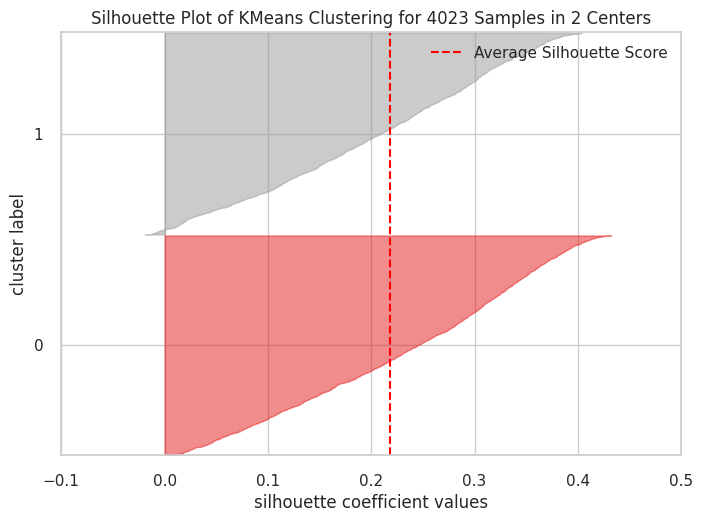

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 4023 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=2, random_state=42))

In [183]:
X = tabela.values
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
print(kmeans.cluster_centers_)
silhouette_visualizer(KMeans(2, random_state=42), X)

[[0.71436939 0.22754994 0.24550197 0.24550197 0.10283888 0.43148006]
 [0.37778363 0.22917611 0.22408676 0.22408676 0.05885845 0.7132657 ]
 [0.77960972 0.18072088 0.20154477 0.20154477 0.05424411 0.80867023]]


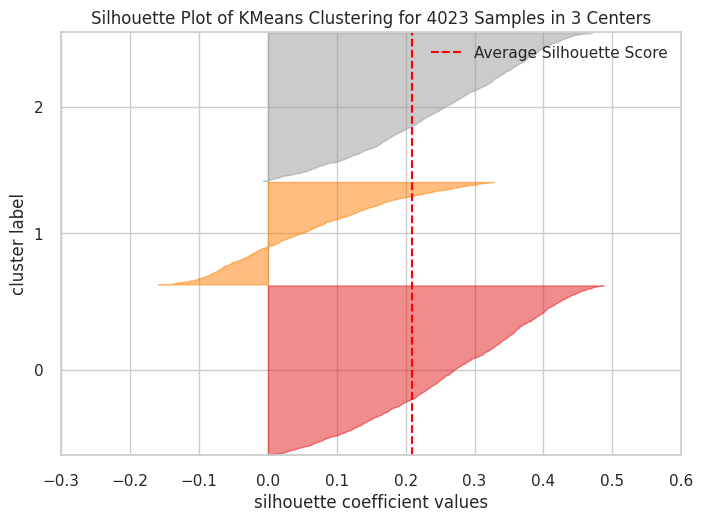

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 4023 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=3, random_state=42))

In [184]:
X = tabela.values
#normalização baseada no intervalo mínimo e máximo (min-max),
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
print(kmeans.cluster_centers_)
silhouette_visualizer(KMeans(3, random_state=42), X)

[[0.37695348 0.21707282 0.20586298 0.20586298 0.0493105  0.75081662]
 [0.6760922  0.27335623 0.4351626  0.4351626  0.19272164 0.65658076]
 [0.64591876 0.22231596 0.1818941  0.1818941  0.06718787 0.39316893]
 [0.80400873 0.17102786 0.17244516 0.17244516 0.03722133 0.78065659]]


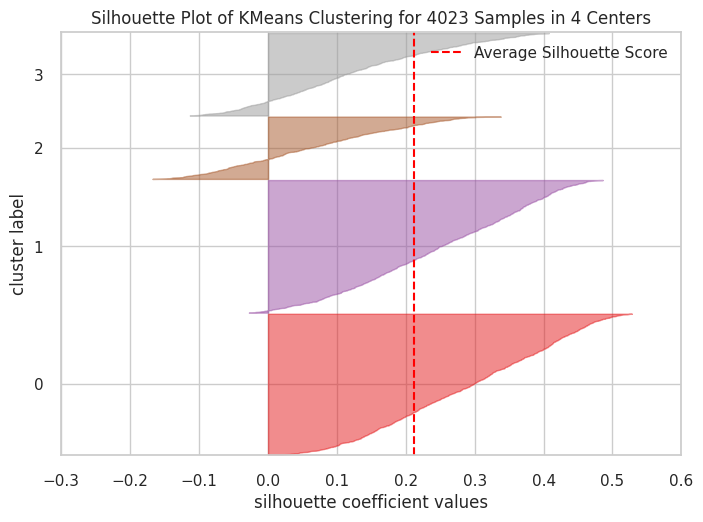

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 4023 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=4, random_state=42))

In [185]:
X = tabela.values
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)
print(kmeans.cluster_centers_)
silhouette_visualizer(KMeans(4, random_state=42), X)

[[0.68038581 0.21021314 0.46066978 0.46066978 0.1970405  0.68874537]
 [0.42106323 0.1920788  0.20231239 0.20231239 0.05817336 0.46077003]
 [0.82594645 0.186034   0.18783472 0.18783472 0.06038781 0.45844875]
 [0.59235115 0.58914766 0.25141243 0.25141243 0.12693032 0.65007995]
 [0.38996219 0.18229288 0.20547235 0.20547235 0.04444444 0.83082993]
 [0.79294736 0.15863842 0.16471106 0.16471106 0.0359408  0.82178188]]


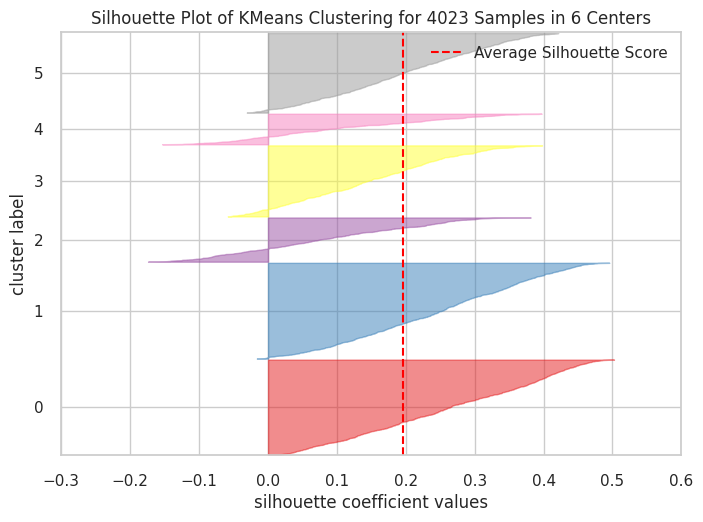

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 4023 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=6, random_state=42))

In [186]:
X = tabela.values
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
kmeans = KMeans(n_clusters=6)
kmeans.fit(X)
print(kmeans.cluster_centers_)
silhouette_visualizer(KMeans(6, random_state=42), X)

[[0.85674653 0.17283878 0.18715847 0.18715847 0.04816029 0.51611506]
 [0.4459408  0.16865914 0.19322453 0.19322453 0.03699308 0.87937406]
 [0.53383642 0.15537064 0.14058544 0.14058544 0.03002813 0.5732177 ]
 [0.56280663 0.27117367 0.23880866 0.23880866 0.14753309 0.19882842]
 [0.82903555 0.15990844 0.17289299 0.17289299 0.03661616 0.84708673]
 [0.68964862 0.20827782 0.46111111 0.46111111 0.19517147 0.69235966]
 [0.61565739 0.5760498  0.24237589 0.24237589 0.11150512 0.70212766]
 [0.27235559 0.23085495 0.27213364 0.27213364 0.07284232 0.61166029]]


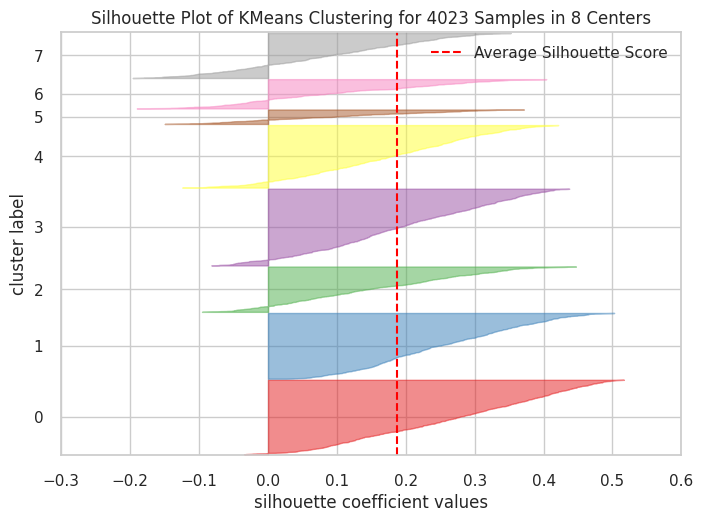

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 4023 Samples in 8 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(random_state=42))

In [187]:
X = tabela.values
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
kmeans = KMeans(n_clusters=8)
kmeans.fit(X)
print(kmeans.cluster_centers_)
silhouette_visualizer(KMeans(8, random_state=42), X)

#cotovelo kmeans
####O que geralmente acontece ao aumentar a quantidade de clusters no KMeans é que as diferenças entre clusters se tornam muito pequenas, e as diferenças das observações intra-clusters vão aumentando. Então é preciso achar um equilíbrio em que as observações que formam cada agrupamento sejam o mais homogêneas possível e que os agrupamentos formados sejam o mais diferentes um dos outros . Como o KMeans calcula a distância das observações até o centro do agrupamento que ela pertence, o ideal é que essa distância seja a menor viável

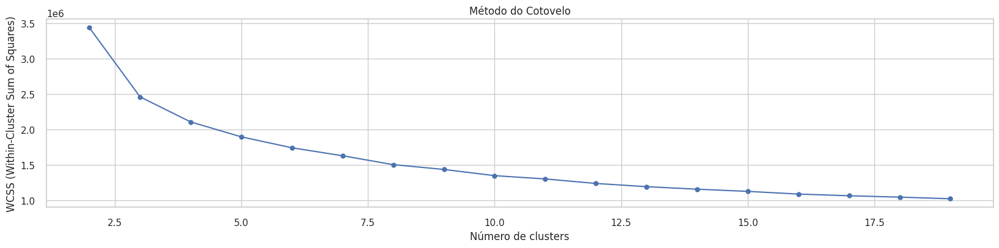

In [188]:
#https://medium.com/pizzadedados/kmeans-e-metodo-do-cotovelo-94ded9fdf3a9
#https://medium.com/pizzadedados/kmeans-e-metodo-do-cotovelo-94ded9fdf3a9
tabela= df.loc[:,['Age','Tumor Size','Regional Node Examined','Regional Node Examined','Regional Node Positive','Survival Months']]
def calculate_wcss(data):
    wcss = []
    for n in range(2, 20):
        kmeans = KMeans(n_clusters=n, random_state=42)  # Adicionando random_state para reprodutibilidade
        kmeans.fit(X=data)
        wcss.append(kmeans.inertia_)
    return wcss

# Calculando o WCSS
wcss_sum = calculate_wcss(tabela)

# Plotando o método do cotovelo
fig, ax = plt.subplots(figsize=(20, 4))
ax.plot(range(2, 20),wcss_sum, marker='o')
ax.set_title("Método do Cotovelo")
ax.set_xlabel("Número de clusters")
ax.set_ylabel("WCSS (Within-Cluster Sum of Squares)")
ax.grid(True)
plt.show()
#10 pontos


In [189]:
tabela.describe()

,Age,Tumor Size,Regional Node Examined,Regional Node Examined,Regional Node Positive,Survival Months
count,4023.000000,4023.000000,4023.000000,4023.000000,4023.000000,4023.000000
mean,53.969923,30.477007,14.358439,14.358439,4.158837,71.301765
std,8.963118,21.121253,8.100241,8.100241,5.109724,22.923009
min,30.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,47.000000,16.000000,9.000000,9.000000,1.000000,56.000000
50%,54.000000,25.000000,14.000000,14.000000,2.000000,73.000000
75%,61.000000,38.000000,19.000000,19.000000,5.000000,90.000000
max,69.000000,140.000000,61.000000,61.000000,46.000000,107.000000


In [190]:
#como se criasse uma linha entre o primerio ponto o ponto 0 e o ultimo ponto o ponto 19
#

def optimal_number_of_clusters(wcss):
    x1, y1 = 2, wcss[0]
    x2, y2 = 20, wcss[len(wcss)-1]

    distances = []
    for i in range(len(wcss)):
        x0 = i+2
        y0 = wcss[i]
        numerator = abs((y2-y1)*x0 - (x2-x1)*y0 + x2*y1 - y2*x1)
        denominator =  np.sqrt((y2 - y1)**2 + (x2 - x1)**2)
        distances.append(numerator/denominator)

    return distances.index(max(distances)) + 2

In [191]:
from sklearn.cluster import KMeans
# calculando a quantidade ótima de clusters
n = optimal_number_of_clusters(wcss_sum)

# rodando o kmeans para nossa quantidade ótima de clusters
kmeans = KMeans(n_clusters=n)
clusters = kmeans.fit_predict(tabela)

In [192]:
tabela.describe()

,Age,Tumor Size,Regional Node Examined,Regional Node Examined,Regional Node Positive,Survival Months
count,4023.000000,4023.000000,4023.000000,4023.000000,4023.000000,4023.000000
mean,53.969923,30.477007,14.358439,14.358439,4.158837,71.301765
std,8.963118,21.121253,8.100241,8.100241,5.109724,22.923009
min,30.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,47.000000,16.000000,9.000000,9.000000,1.000000,56.000000
50%,54.000000,25.000000,14.000000,14.000000,2.000000,73.000000
75%,61.000000,38.000000,19.000000,19.000000,5.000000,90.000000
max,69.000000,140.000000,61.000000,61.000000,46.000000,107.000000


In [193]:
#https://www.cancerresearchuk.org/about-cancer/what-is-cancer/stages-of-cancer#:~:text=T%20refers%20to%20the%20size,be%20between%200%20and%203.

#https://www.cancer.gov/publications/dictionaries/cancer-terms/def/stage-iib-non-small-cell-lung-cancer

#https://cancer.ca/en/cancer-information/what-is-cancer/stage-and-grade#:~:text=Cancer%20grade%20is%20based%20on,1%20to%203%20or%204.

In [194]:
#https://medium.com/@teppan_noodle/exploratory-data-analysis-eda-using-python-f85938cb1810
#https://medium.com/@renata-biaggi/guia-completo-an%C3%A1lise-explorat%C3%B3ria-de-dados-com-python-2964fa2940f4

In [195]:
#https://colab.research.google.com/drive/1q4E3kRQn_asnyBLCJeHSEvxtf-IHrFnI#scrollTo=vYKFSzx3yrC3